# Проект 4. Компьютер говорит нет!

Цель проекта: Построение банковской модели, предсказывающей вероятность дефолта по кредиту на основе данных по клиенту



## Загрузка всех необъодимых библиотек

In [71]:
import pandas as pd
import numpy as np
from pandas import Series
from datetime import date

import pandas_profiling
from pandas_profiling import ProfileReport

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import auc, roc_auc_score, roc_curve
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score, recall_score

from sklearn.model_selection import GridSearchCV

from sklearn.preprocessing import PolynomialFeatures


import imblearn
from imblearn.over_sampling import SMOTE


## Загрузка и предварительный анализ датасета


Описания полей:

client_id - идентификатор клиента

education - уровень образования

sex - пол заемщика

age - возраст заемщика

car - флаг наличия автомобиля

car_type - флаг автомобиля иномарки

decline_app_cnt - количество отказанных прошлых заявок

good_work - флаг наличия “хорошей” работы

bki_request_cnt - количество запросов в БКИ

home_address - категоризатор домашнего адреса

work_address - категоризатор рабочего адреса

income - доход заемщика

foreign_passport - наличие загранпаспорта

default - флаг дефолта по кредиту


Метрика качества

Результаты оцениваются по площади под кривой ROC AUC

In [6]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73799 entries, 0 to 73798
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   client_id         73799 non-null  int64  
 1   app_date          73799 non-null  object 
 2   education         73492 non-null  object 
 3   sex               73799 non-null  object 
 4   age               73799 non-null  int64  
 5   car               73799 non-null  object 
 6   car_type          73799 non-null  object 
 7   decline_app_cnt   73799 non-null  int64  
 8   good_work         73799 non-null  int64  
 9   score_bki         73799 non-null  float64
 10  bki_request_cnt   73799 non-null  int64  
 11  region_rating     73799 non-null  int64  
 12  home_address      73799 non-null  int64  
 13  work_address      73799 non-null  int64  
 14  income            73799 non-null  int64  
 15  sna               73799 non-null  int64  
 16  first_time        73799 non-null  int64 

In [8]:
RANDOM_SEED = 42
!pip freeze > requirements.txt
CURRENT_DATE = pd.to_datetime('09/11/2020')

In [9]:
profile = ProfileReport(train)
profile

In [10]:
profile = ProfileReport(test)
profile

## По предварительному анализу данных:

Тренировочный датасет 73799 клиентов, 
Тестовый датасет 36349.


Целевая переменная default является бинарной и показывает наличие дефолта по клиенту '1' - да, '0' - нет.

client_id уникальный числовой признак, который содержит числовой признак клиента.

Остальные признаки: 1 - временной ряд, 5 бинарных, 6 категориальных и 5 числовых.

Пропуски имеются только в переменной education 307 - в наборе train.

По графику прослеживается корреляции между home_address и work_address, car и car_type.

## Создание функций


In [11]:
# Функция, присвающая выбросам значения в межквартильном пределе  
def cut_IQR(column, data):
    Q25 = train[column].quantile(0.25)
    Q75 = train[column].quantile(0.75)
    IQR = Q75 - Q25
    l_bound = Q25 - 1.5*IQR
    r_bound = Q75 + 1.5*IQR

    data[column] = data[column].apply(lambda x: r_bound if x  >=  r_bound else x)
    data[column] = data[column].apply(lambda x: l_bound if x  <=  l_bound else x)

In [12]:
# Функция расчета точности, а также составляющих матрицы ошибок
def calc_accuracy(y_true, y_pred):
    P = np.sum(y_true == 1)
    N = np.sum(y_true == 0)
    TP = np.sum((y_true == 1) & (y_pred == 1))
    TN = np.sum((y_true == 0) & (y_pred == 0))
    acc = (TP + TN) / (P + N)
    return acc, TP, TN, P, N

In [13]:
# Метрики модели
def metrics(y_test, probs, y_pred_test):
    fpr, tpr, threshold = roc_curve(y_test, probs)
    roc_auc = roc_auc_score(y_test, probs)

    plt.figure()
    plt.plot([0, 1], label='Baseline', linestyle='--')
    plt.plot(fpr, tpr, label = 'Regression')
    plt.title('Logistic Regression ROC AUC = %0.5f' % roc_auc)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.legend(loc = 'lower right')
    plt.show()

    f1_test_n = f1_score(y_test, y_pred_test)
    print('f1 score:=',round(f1_test_n,4))

    precision = precision_score(y_test, y_pred_test)
    recall = recall_score(y_test, y_pred_test)
    print('precision: {:.4f}\nrecall: {:.4f}'.format(precision, recall))

    calc_accuracy(y_test, y_pred_test)
    acc, TP, TN, P, N = calc_accuracy(y_test, y_pred_test)
    print('TP = {}\nTN = {}\nP = {}\nN = {}\nacc = {:.4f}'.format(TP, TN, P, N, acc))

    conf_mat = confusion_matrix(y_test, y_pred_test)
    print('Confusion matrix:\n{}'.format(conf_mat))
    disp = ConfusionMatrixDisplay(confusion_matrix=conf_mat,display_labels=model.classes_)
    disp.plot()

Начнем обработку и группировку данных и более детальный анализ

In [14]:
# бинарные переменные
bin_cols = ['sex', 'car', 'car_type', 'foreign_passport', 'good_work']

# категориальные переменные
cat_cols = ['education', 'home_address', 'work_address',
            'region_rating', 'sna', 'first_time']

# числовые данные
num_cols = ['age', 'decline_app_cnt', 'income', 'bki_request_cnt', 'score_bki']

Посмотри мна нашу целевую переменную default


<AxesSubplot:>

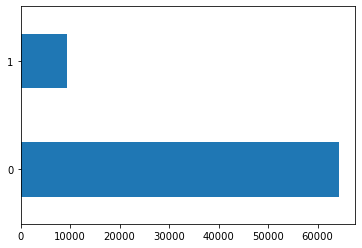

In [15]:
train['default'].value_counts().plot.barh()

По данным графика видно, что результаты разделены неравномерно. Недефолтных клиентов больше.

### Обратим внимание на переменную score_bki
Она имеет нормальное распределение, но в основном значения ниже нуля и только несколько положительных. Скорее всего это ошибка, попробуем заменить все значения на положительные, может будет меньше выбросов.

In [16]:
display(train.score_bki.value_counts())


-1.775263    352
-2.225004    296
-2.104211    288
-2.169664    258
-1.920823    185
            ... 
-1.243395      1
-1.732555      1
-1.904082      1
-2.386521      1
-2.729079      1
Name: score_bki, Length: 69096, dtype: int64

In [17]:
train['score_bki'] = train['score_bki'].abs()


In [18]:
display(train.score_bki.value_counts())


1.775263    352
2.225004    296
2.104211    288
2.169664    258
1.920823    185
           ... 
1.243395      1
1.732555      1
1.904082      1
2.386521      1
2.729079      1
Name: score_bki, Length: 69096, dtype: int64

## Обработка пропусков

In [19]:
train.isnull().sum()
test.isnull().sum()

client_id             0
app_date              0
education           171
sex                   0
age                   0
car                   0
car_type              0
decline_app_cnt       0
good_work             0
score_bki             0
bki_request_cnt       0
region_rating         0
home_address          0
work_address          0
income                0
sna                   0
first_time            0
foreign_passport      0
dtype: int64

<AxesSubplot:>

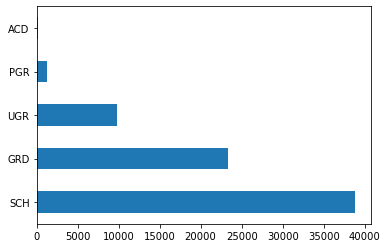

In [20]:
train['education'].value_counts().plot.barh()

In [21]:
display(train.education.value_counts(dropna=False))

SCH    38860
GRD    23365
UGR     9816
PGR     1257
NaN      307
ACD      194
Name: education, dtype: int64

In [22]:
# Функция рандомно заполняет пропуски имеющимися значениями для придания реалистичности
def nan_to_education(column):
    nan_index_list = train[pd.isna(train[column])].index
    for index in nan_index_list:
        train.iat[index, train.columns.get_loc(column)] = np.random.choice(
            ['ACD', 'PGR', 'UGR', 'GRD', 'SCH'], 1)[0]


nan_to_education('education')

In [23]:
display(train.education.value_counts(dropna=False))


SCH    38921
GRD    23427
UGR     9872
PGR     1324
ACD      255
Name: education, dtype: int64

In [24]:
# обработка 'education' - создадим словарь и подставим значения из него
ed_dict = {'SCH': 0, 'UGR': 1, 'GRD': 2, 'PGR': 3, 'ACD': 4}
train.education = train.education.replace(ed_dict)


## Преобразование временной переменной

Преобразуем значение в столбце app_date (дата подачи заявления) в удобный формат и попробуем на основании него сгенерировать новую переменную

In [25]:
train.app_date = pd.to_datetime(train.app_date)

display(train.head(2))


,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default
0,25905,2014-02-01,0,M,62,Y,Y,0,0,2.008753,1,50,1,2,18000,4,1,N,0
1,63161,2014-03-12,0,F,59,N,N,0,0,1.532276,3,50,2,3,19000,4,1,N,0


In [26]:
# проверим начало и конец периода нашего датасета
start = train.app_date.min()
end = train.app_date.max()
start, end

(Timestamp('2014-01-01 00:00:00'), Timestamp('2014-04-30 00:00:00'))

In [27]:
# Вводим новый признак - номер дня с 1 января
train['df_days'] = (train.app_date - start).dt.days.astype('int')

<AxesSubplot:xlabel='df_days'>

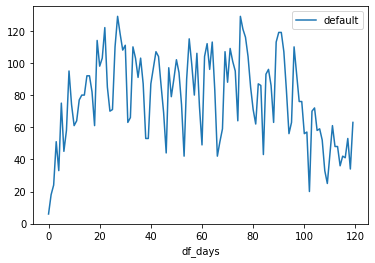

In [28]:
# проверим количество дефолтов в течение срока, отражённого в представленном датасете
train[['default'] + ['df_days']].groupby('df_days').sum().plot()

In [29]:
# бинарный для заявок в выходные
train['is_weekend'] = train.app_date.dt.weekday > 4
# категориальный для месяцев заявок
train['month'] = train.app_date.dt.month
# категориальный для дней
train['day'] = train.app_date.dt.weekday
# бинарный для конца месяца
train['start_month'] = train.app_date.dt.day < 7

## Рассмотрим числовые переменные


array([[<AxesSubplot:title={'center':'age'}>,
        <AxesSubplot:title={'center':'decline_app_cnt'}>],
       [<AxesSubplot:title={'center':'income'}>,
        <AxesSubplot:title={'center':'bki_request_cnt'}>],
       [<AxesSubplot:title={'center':'score_bki'}>, <AxesSubplot:>]],
      dtype=object)

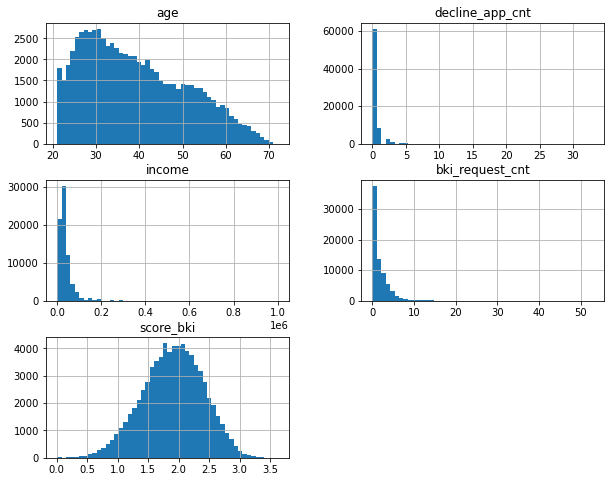

In [30]:
train[num_cols].hist(figsize=(10, 8), bins=50)

Нормально распределён только признак score_bki. Остальные требуют преобразования.



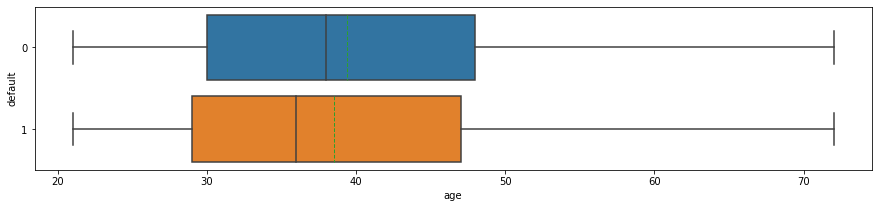

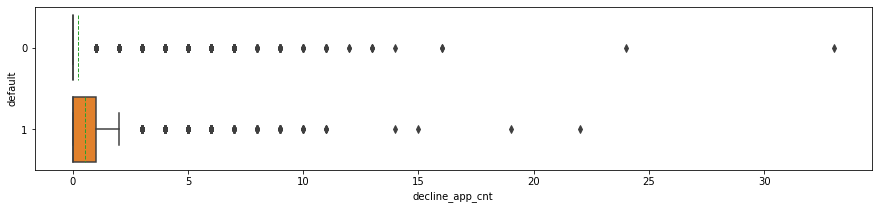

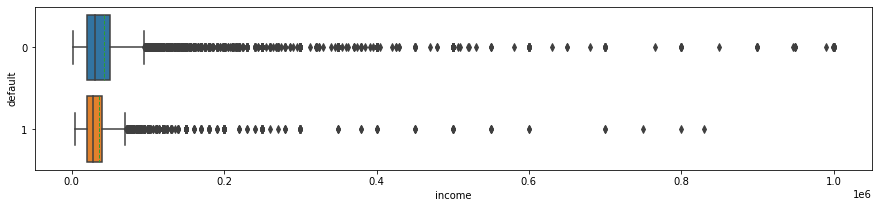

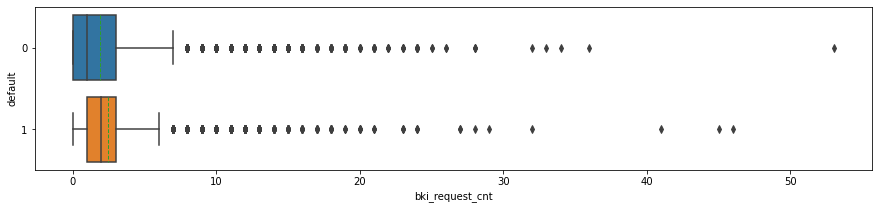

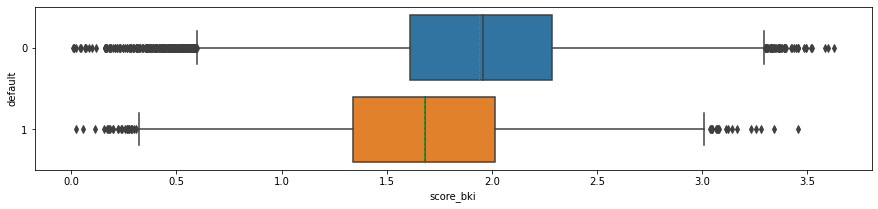

In [31]:
# распределения всех количественных признаков, кроме score_bki и df_days, имеют смещения, и, скорее всего, выбросы.
# построим boxplot
for col in num_cols:
    plt.figure(figsize=(15, 3))
    sns.boxplot(y=train.default, x=train[col],
                showmeans=True, meanline=True, orient='h')

Выводы:

* Средний возраст клиентов, у которых был дефолт, ниже.

* Клиенты, у которых не было дефолтов, в среднем почти не получали отказов в кредите, но есть исключения.

* Клиенты с дефолтами в среднем имеют более высокий показатель отказов.

* Средний доход клиентов без дефолтов выше.

* Средняя рейтинга регионов клиентов без дефолта выше, но межквартильное расстояние больше.

* Выбросы есть у признаков: score_bki bki_request_cnt income decline_app_cnt

Корреляция числовых признаков:

<AxesSubplot:>

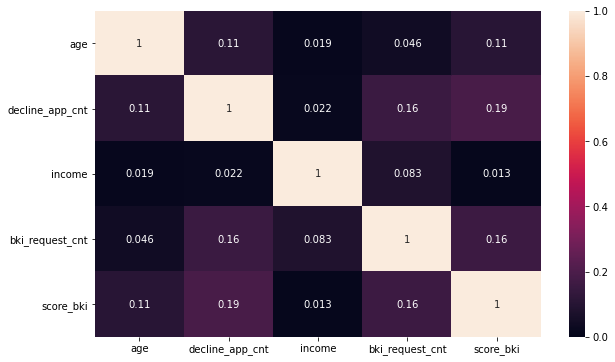

In [32]:
fig, ax = plt.subplots(figsize=(10,6))
sns.heatmap(train[num_cols].corr().abs(), vmin=0, vmax=1, annot=True)

Сильные корреляции между числовыми переменными отсутствуют. Самая большая связь наблюдается между доходом и рейтингом регионов, а также между скорингом банка и отказом в кредите.



In [33]:
# Ограничим выбросы в отказах до 8
train['decline_app_cnt'] = train['decline_app_cnt'].apply(lambda x: 8 if x  >=  8 else x)
# Создадим бинарную переменную, учитывая, что большое количество клиентов вообще не имеет отказов
train['decline_app_bin'] = train['decline_app_cnt'].apply(lambda x: 1 if x  >=  1 else 0)

In [34]:
# Создадим бинарный признак для доходов 
train['income_bin'] = train['income'].apply(lambda x: 1 if x  < 25000  else 0)

In [35]:
# В признаках количества заявок на кредит и доходе ограничим значения до IQR
for col in ['bki_request_cnt','income',]:
    cut_IQR(col, train)

In [36]:
#обновим список переменных
bin_cols = ['sex', 'car', 'car_type', 'foreign_passport', 'good_work','is_weekend',
            'start_month','decline_app_bin','income_bin']
cat_cols = ['education', 'home_address', 'work_address','sna','first_time','month','day']
num_cols = ['age', 'decline_app_cnt', 'income', 'bki_request_cnt', 'score_bki','region_rating']

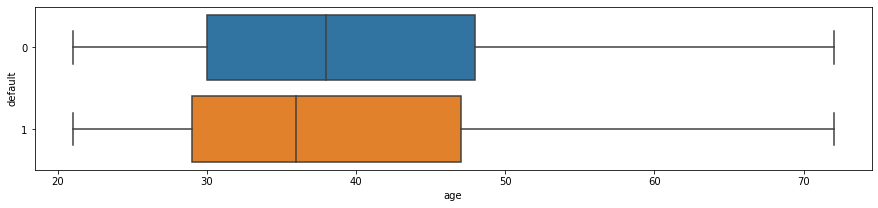

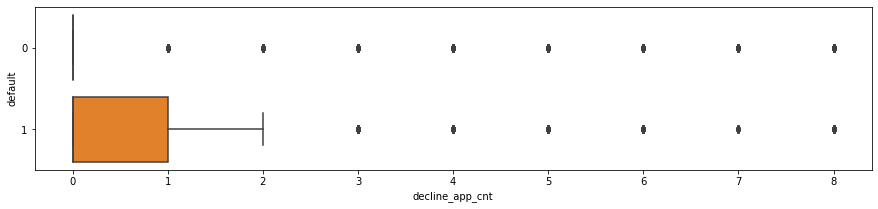

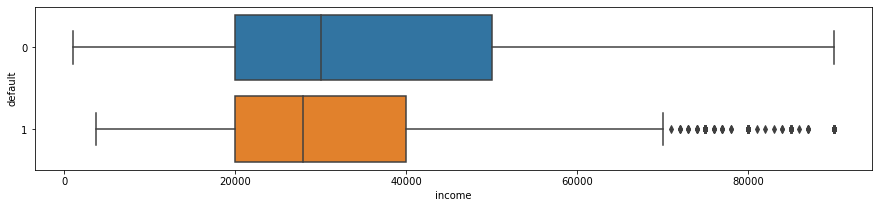

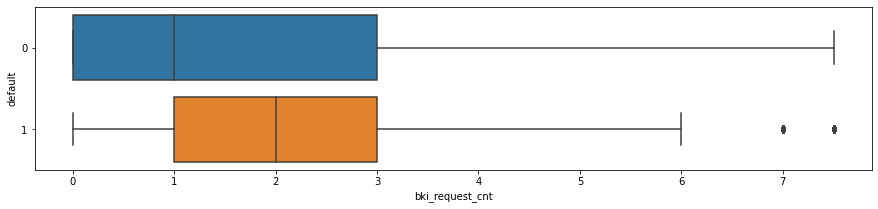

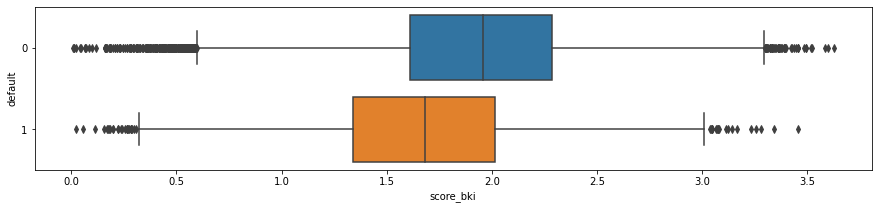

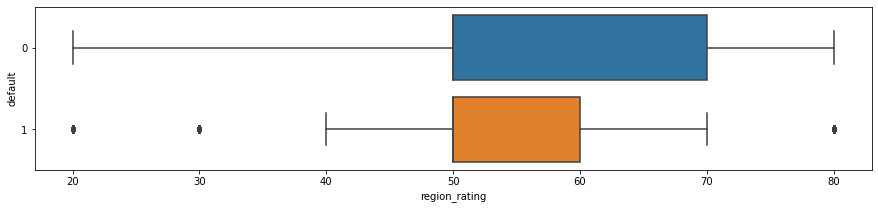

In [37]:
#посмотрим, как изменились графики
for col in num_cols:
    plt.figure(figsize=(15,3))
    sns.boxplot(y = train['default'], x = train[col], orient='h')

<AxesSubplot:>

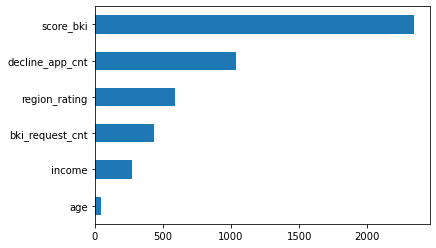

In [38]:
# Посмотрим на значимость влияния числовых факторов на целевую переменную в обучаемой выборке
imp_num = pd.Series(f_classif(train[num_cols], train['default'])[0], index = num_cols)
imp_num.sort_values(inplace = True)
imp_num.plot(kind = 'barh')

Наибольшее влияние оказывают скоринг банка и количество отказов.



## Рассмотрим бинарные переменные

In [39]:
# Признак наличия автомобиля и наличие иномарки перекликаются (car, car_type), мы можем их объединить в один
train['car_and_type'] = train.apply(lambda x: ('0')
                                    if x.car == 'N' else x.car_type, axis=1)
train['car_and_type'] = train['car_and_type'].replace(
    'N', '1').replace('Y', '2')
train['car_and_type'] = train['car_and_type'].apply(lambda x: int(x))

test['car_and_type'] = test.apply(lambda x: ('0')
                                  if x.car == 'N' else x.car_type, axis=1)
test['car_and_type'] = test['car_and_type'].replace('N', '1').replace('Y', '2')
test['car_and_type'] = test['car_and_type'].apply(lambda x: int(x))

# добавление нового признака в список категориальных переменных
cat_cols.append('car_and_type')


In [40]:
# Проверим какие значения имеются в переменных и на что они будут заменены.
label_encoder = LabelEncoder()
for column in bin_cols:
    label_encoder.fit(train[column])
    print(column, dict(enumerate(label_encoder.classes_)))

sex {0: 'F', 1: 'M'}
car {0: 'N', 1: 'Y'}
car_type {0: 'N', 1: 'Y'}
foreign_passport {0: 'N', 1: 'Y'}
good_work {0: 0, 1: 1}
is_weekend {0: False, 1: True}
start_month {0: False, 1: True}
decline_app_bin {0: 0, 1: 1}
income_bin {0: 0, 1: 1}


In [41]:
# Для бинарных признаков мы будем использовать LabelEncoder

label_encoder = LabelEncoder()

for column in bin_cols:
    train[column] = label_encoder.fit_transform(train[column])

# убедимся в преобразовании
train.head()

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,...,foreign_passport,default,df_days,is_weekend,month,day,start_month,decline_app_bin,income_bin,car_and_type
0,25905,2014-02-01,0,1,62,1,1,0,0,2.008753,...,0,0,31,1,2,5,1,0,1,2
1,63161,2014-03-12,0,0,59,0,0,0,0,1.532276,...,0,0,70,0,3,2,0,0,1,0
2,25887,2014-02-01,0,1,25,1,0,2,0,1.408142,...,1,0,31,1,2,5,1,1,0,1
3,16222,2014-01-23,0,0,53,0,0,0,0,2.057471,...,0,0,22,0,1,3,0,0,1,0
4,101655,2014-04-18,2,1,48,0,0,0,1,1.244723,...,1,0,107,0,4,4,0,0,0,0


<AxesSubplot:>

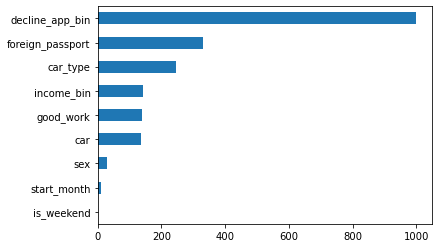

In [42]:
# Посмотрим на значимость бинарных переменных в обучаемой выборке
imp_num = pd.Series(f_classif(train[bin_cols], train['default'])[0], index = bin_cols)
imp_num.sort_values(inplace = True)
imp_num.plot(kind = 'barh')

Сильнее всего влияет отсутствие или наличие отказа в кредите. Довольно сильно влияет наличие загранпаспорта и тип машины.

## Рассмотрим категориальные переменные

<AxesSubplot:>

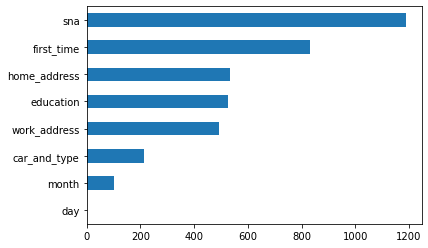

In [43]:
# Посмотрим на значимость категориальных переменных
imp_num = pd.Series(f_classif(train[cat_cols], train['default'])[0], index = cat_cols)
imp_num.sort_values(inplace = True)
imp_num.plot(kind = 'barh')

<AxesSubplot:>

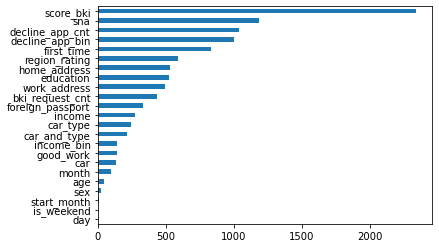

In [44]:
# Рассмотрим значимость всех переменных
imp_num = pd.Series(f_classif(train[cat_cols + num_cols + bin_cols], 
                              train['default'])[0], index = cat_cols + num_cols + bin_cols)
imp_num.sort_values(inplace = True)
imp_num.plot(kind = 'barh')

In [45]:
# окончательный список признаков
bin_cols = ['sex', 'car', 'car_type', 'foreign_passport', 'good_work','start_month',
            'decline_app_bin','income_bin']
cat_cols = ['education', 'home_address','sna','work_address','first_time','month',]
num_cols = ['age', 'decline_app_cnt', 'income', 'bki_request_cnt', 'score_bki','region_rating']

## Построение модели

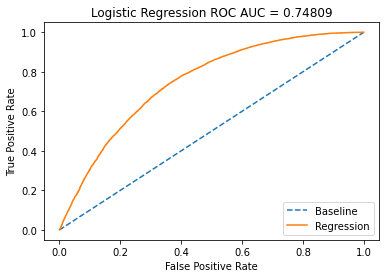

f1 score:= 0.6902
precision: 0.6826
recall: 0.6978
TP = 8998
TN = 8694
P = 12894
N = 12877
acc = 0.6865
Confusion matrix:
[[8694 4183]
 [3896 8998]]


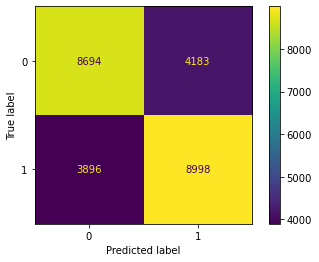

In [46]:
X_cat = OneHotEncoder(sparse = False).fit_transform(train[cat_cols].values)
X_num = train[num_cols].values
X_bin = train[bin_cols].values

# Объединяем три типа данных в одну матрицу значений Х
X = np.hstack([X_num, X_bin, X_cat])
y = train['default'].values

X_resampled, y_resampled = SMOTE().fit_resample(X, y)

# Делим данные
X_train, X_val, y_train, y_val = train_test_split(X_resampled, y_resampled, 
                                                    test_size=0.20,  random_state=42)
# Стандартизируем числовые переменные
scaler = StandardScaler()

X_train[:,:len(num_cols)] = scaler.fit_transform(X_train[:,:len(num_cols)]) 
X_val[:,:len(num_cols)] = scaler.transform(X_val[:,:len(num_cols)])

# Обучаем модель только с указанием максимального значения итерации
model = LogisticRegression(max_iter=190)
model.fit(X_train, y_train)

# Предсказываем на разделенной выборке из train
y_pred_val = model.predict(X_val)
probs = model.predict_proba(X_val)
probs = probs[:,1]

# Выводим показатели метрики
metrics(y_val, probs, y_pred_val)

In [47]:

# Добавим типы регуляризации
penalty = ['l1', 'l2']

# Зададим ограничения для параметра регуляризации
C = np.logspace(0, 4, 10)

# Создадим гиперпараметры
hyperparameters = dict(C=C, penalty=penalty)

model = LogisticRegression()
model.fit(X_train, y_train)

# Создаем сетку поиска с использованием 5-кратной перекрестной проверки
clf = GridSearchCV(model, hyperparameters, cv=5, verbose=0)

best_model = clf.fit(X_train, y_train)

# View best hyperparameters
print('Лучшее Penalty:', best_model.best_estimator_.get_params()['penalty'])
print('Лучшее C:', best_model.best_estimator_.get_params()['C'])

C:\work\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\work\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\work\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py", line 1304, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\work\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py", line 442, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.

  warnings.warn("Estimator fit failed. The score on this train-test"
C:\work\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:548: FitFailedWarning: Esti

Лучшее Penalty: l2
Лучшее C: 1.0


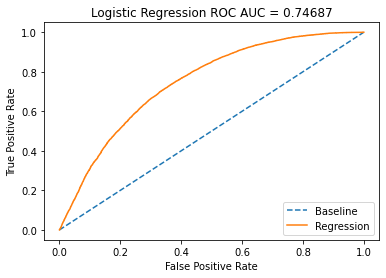

f1 score:= 0.686
precision: 0.6800
recall: 0.6921
TP = 8924
TN = 8678
P = 12894
N = 12877
acc = 0.6830
Confusion matrix:
[[8678 4199]
 [3970 8924]]


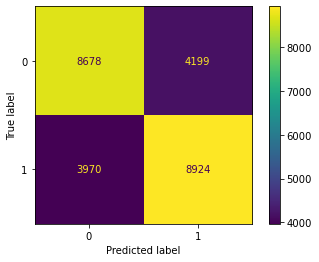

In [50]:
# С учетом гиперпараметров:
model = LogisticRegression(C=1,penalty='l2', max_iter=190)
model.fit(X_train, y_train)

y_pred_val = model.predict(X_val)
probs = model.predict_proba(X_val)
probs = probs[:,1]

metrics(y_val, probs, y_pred_val)

In [51]:
# Применим преобразования к тестовому файлу

test.app_date = pd.to_datetime(test.app_date)
test['month'] = test.app_date.dt.month
test['start_month'] = test.app_date.dt.day < 7
test['decline_app_cnt'] = test['decline_app_cnt'].apply(lambda x: 8 if x  >=  8 else x)
test['decline_app_bin'] = test['decline_app_cnt'].apply(lambda x: 1 if x  >=  1 else 0)
test['income_bin'] = test['income'].apply(lambda x: 1 if x  < 25000  else 0)
for col in ['bki_request_cnt','income',]:
    cut_IQR(col, test)

bin_cols = ['sex', 'car', 'car_type', 'foreign_passport', 'good_work','start_month',
            'decline_app_bin','income_bin']
cat_cols = ['education', 'home_address','sna','work_address','first_time','month',]
num_cols = ['age', 'decline_app_cnt', 'income', 'bki_request_cnt', 'score_bki','region_rating']    

label_encoder = LabelEncoder()
for column in bin_cols:
    test[column] = label_encoder.fit_transform(test[column])
mode_education  = test['education'].mode()[0]
test['education'] = test['education'].apply(lambda x: mode_education if str(x) == 'nan' else x)
education_dict = {'SCH': 0, 'UGR': 1, 'GRD': 2, 'PGR': 4, 'ACD': 5}
test.education = test.education.replace(education_dict)

In [52]:
X_cat_test = OneHotEncoder(sparse = False).fit_transform(test[cat_cols].values)
X_num_test = test[num_cols].values
X_bin_test = test[bin_cols].values

X_test = np.hstack([X_num_test, X_bin_test, X_cat_test])

scaler = StandardScaler()
X_test[:,:len(num_cols)] = scaler.fit_transform(X_test[:,:len(num_cols)]) 

y_pred_test = model.predict(X_test)
probs_test = model.predict_proba(X_test)
probs_test = probs_test[:,1]

In [53]:
test['default'] = probs_test
submission = test[['client_id','default']]
display(submission.sample(10))
display(submission.shape)

submission.to_csv('submission.csv', index=False)

,client_id,default
10433,18887,0.417742
22577,14284,0.529899
9008,86671,0.304210
19343,9599,0.221755
14707,33195,0.272898
6871,87004,0.387135
33750,99624,0.749031
27863,57457,0.467401
129,107464,0.720416
3164,3242,0.343999


(36349, 2)